# Task05 【代码实战】CAM、Captum

## 0 实验准备

### 0.1 导入基本工具包

In [1]:
# 导入中文字体
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageFont, ImageDraw
%matplotlib inline
matplotlib.rc("font",family='SimHei') # 中文字体
plt.rcParams['axes.unicode_minus']=False  # 用来正常显示负号
# 导入中文字体，指定字体大小
font = ImageFont.truetype('./data/SimHei.ttf', 50)

In [2]:
# 使用torch-gpu
import torch
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda:0


In [3]:
import cv2
import numpy as np

### 0.2 导入ImageNet预训练模型

In [4]:
from torchvision import models
model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model = model.eval().to(device)

In [5]:
import torch.nn as nn

if torch.cuda.device_count() > 1:
    print(f"Let's use {torch.cuda.device_count()}")
    model = nn.DataParallel(model)
    
model = model.to(device)

### 0.3 使用ImageNet 1000图像分类标签

In [6]:
import pandas as pd
df = pd.read_csv('./data/imagenet_class_index.csv')
idx_to_labels = {}
idx_to_labels_cn = {}
for idx, row in df.iterrows():
    idx_to_labels[row['ID']] = row['class']
    idx_to_labels_cn[row['ID']] = row['Chinese']

## 1 CAM代码实战

实验目的：通过Python API方式，使用torchcam算法库，对Pytorch预训练ImageNet-1000图像分类模型进行基于CAM的可解释性分析。

### 1.1 预训练ImageNet-1000图像分类-单张图像

In [6]:
# 使用GradCAMpp可解释性分析方法
# 可使用的可解释性分析方法有CAM GradCAM GradCAMpp ISCAM LayerCAM SSCAM ScoreCAM SmoothGradCAMpp XGradCAM
from torchcam.methods import SmoothGradCAMpp 

cam_extractor = SmoothGradCAMpp(model)

In [7]:
# 预处理
from torchvision import transforms
# 测试集图像预处理-RCTN：缩放、裁剪、转 Tensor、归一化
test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

In [8]:
# 运行图像分类预测
img_path = 'test_img/cat_dog.jpg'

img_pil = Image.open(img_path)
input_tensor = test_transform(img_pil).unsqueeze(0).to(device) # 预处理

In [9]:
pred_logits = model(input_tensor)
pred_top1 = torch.topk(pred_logits, 1)
pred_id = pred_top1[1].detach().cpu().numpy().squeeze().item()
pred_id

282

In [10]:
# 生成可解释性分析热力图
activation_map = cam_extractor(pred_id, pred_logits)

activation_map = activation_map[0][0].detach().cpu().numpy()
activation_map

array([[0.40417454, 0.4650442 , 0.29064488, 0.09019459, 0.        ,
        0.0139825 , 0.01950697],
       [0.6321533 , 0.7831163 , 0.5210378 , 0.25083402, 0.14366932,
        0.19835463, 0.18547958],
       [0.7484453 , 0.9819809 , 0.690357  , 0.35505724, 0.2633007 ,
        0.32428882, 0.3192858 ],
       [0.86078334, 1.        , 0.6908591 , 0.36377096, 0.4115113 ,
        0.49939117, 0.4773391 ],
       [0.68462795, 0.76393026, 0.52284867, 0.25448754, 0.38738552,
        0.49786174, 0.5144018 ],
       [0.46659428, 0.48174146, 0.28935727, 0.12723985, 0.34024963,
        0.53202957, 0.5185817 ],
       [0.23474544, 0.2220884 , 0.11934734, 0.06653956, 0.20421647,
        0.38006833, 0.3480706 ]], dtype=float32)

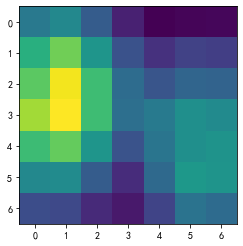

In [11]:
# 可视化
plt.imshow(activation_map)
plt.show()

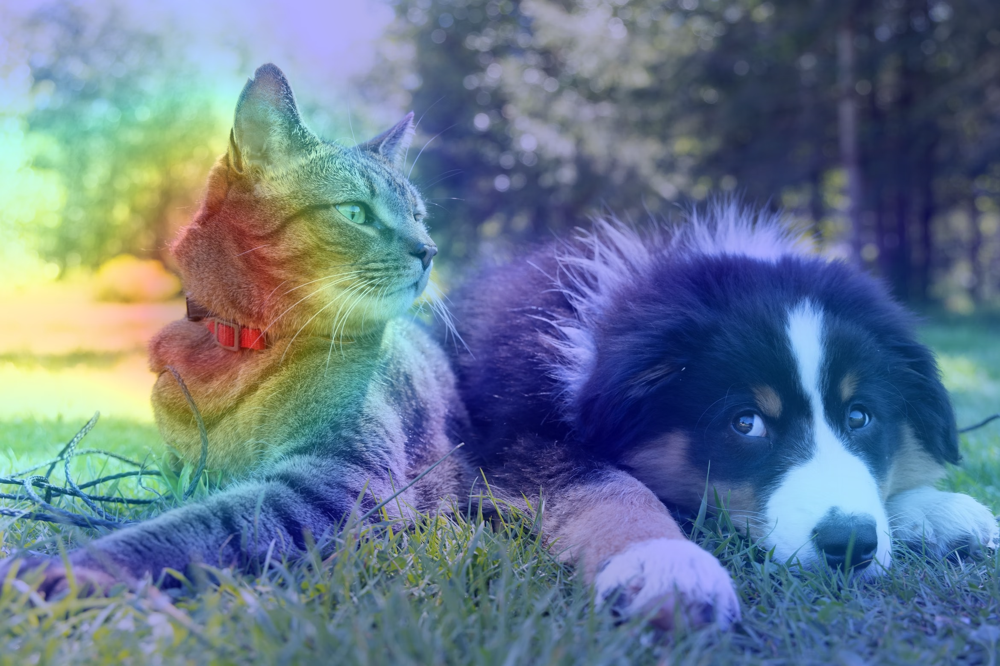

In [12]:
from torchcam.utils import overlay_mask

result = overlay_mask(img_pil, Image.fromarray(activation_map), alpha=0.7)
result

In [13]:
img_path = './test_img/cat_dog.jpg'

In [14]:
# 可视化热力图的类别ID，如果为 None，则为置信度最高的预测类别ID
# 边牧犬
show_class_id = 231

# 是否显示中文类别
Chinese = True

In [15]:
def get_cam(img_pil, test_transform, model, cam_extractor, 
            show_class_id, pred_id, device):
    # 前向预测
    input_tensor = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
    pred_logits = model(input_tensor)
    pred_top1 = torch.topk(pred_logits, 1)
    pred_id = pred_top1[1].detach().cpu().numpy().squeeze().item()
    
    # 可视化热力图的类别ID，如果不指定，则为置信度最高的预测类别ID
    if show_class_id:
        show_id = show_class_id
    else:
        show_id = pred_id
        show_class_id = pred_id
    
    # 生成可解释性分析热力图
    activation_map = cam_extractor(show_id, pred_logits)
    activation_map = activation_map[0][0].detach().cpu().numpy()
    result = overlay_mask(img_pil, Image.fromarray(activation_map), alpha=0.7)
    return result, pred_id, show_class_id

In [16]:
img_pil = Image.open(img_path)
result, pred_id, show_class_id = get_cam(img_pil, test_transform, model, cam_extractor, 
                                show_class_id, pred_id, device)

In [17]:
def print_image_label(result, pred_id, show_class_id, 
                      idx_to_labels, idx_to_labels_cn=None, Chinese=False):
    # 在图像上写字
    draw = ImageDraw.Draw(result)

    if Chinese:
        # 在图像上写中文
        text_pred = 'Pred Class: {}'.format(idx_to_labels_cn[pred_id])
        text_show = 'Show Class: {}'.format(idx_to_labels_cn[show_class_id])
    else:
        # 在图像上写英文
        text_pred = 'Pred Class: {}'.format(idx_to_labels[pred_id])
        text_show = 'Show Class: {}'.format(idx_to_labels[show_class_id])
    # 文字坐标，中文字符串，字体，rgba颜色
    draw.text((50, 100), text_pred, font=font, fill=(255, 0, 0, 1))
    draw.text((50, 200), text_show, font=font, fill=(255, 0, 0, 1))
    
    return result

In [18]:
result = print_image_label(result, pred_id, show_class_id,
                           idx_to_labels, idx_to_labels_cn, Chinese)

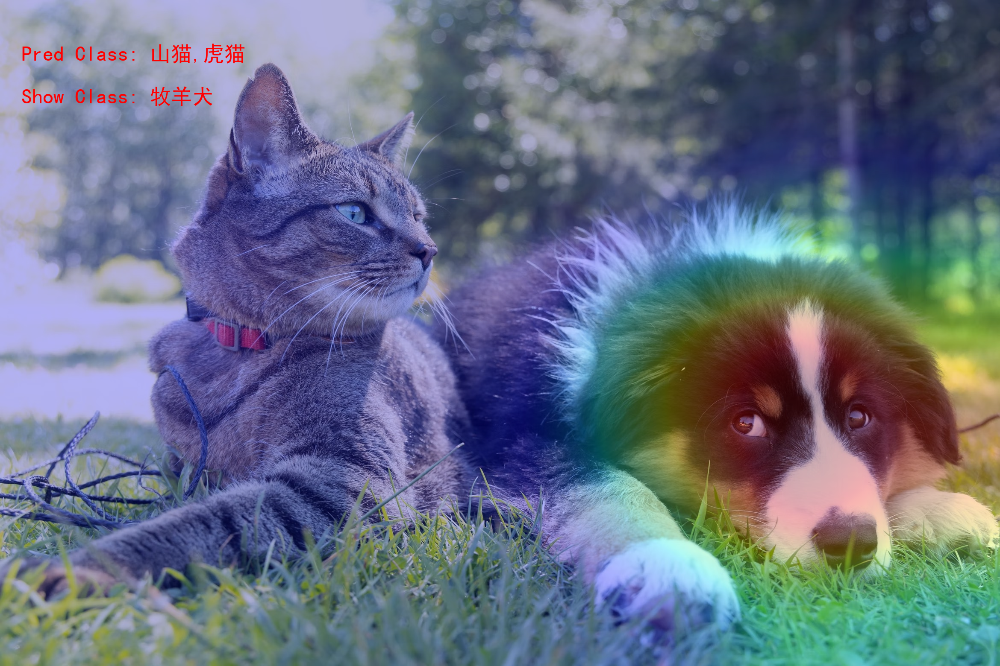

In [19]:
result

### 1.2 预训练ImageNet-1000图像分类-视频文件

In [20]:
def pred_single_frame(img, show_class_id=None, Chinese=True):
    '''
    输入摄像头画面bgr-array和用于绘制热力图的类别ID，输出写字的热力图PIL-Image
    如果不指定类别ID，则为置信度最高的预测类别ID
    '''
    
    img_bgr = img
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR 转 RGB
    img_pil = Image.fromarray(img_rgb) # array 转 pil
    input_tensor = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
    pred_logits = model(input_tensor) # 执行前向预测，得到所有类别的 logit 预测分数
    pred_top1 = torch.topk(pred_logits, 1)
    pred_id = pred_top1[1].detach().cpu().numpy().squeeze().item()
    
    # 可视化热力图的类别ID，如果为 None，则为置信度最高的预测类别ID
    if show_class_id:
        show_id = show_class_id
    else:
        show_id = pred_id
        show_class_id = pred_id
        
    # 生成可解释性分析热力图
    activation_map = cam_extractor(show_id, pred_logits)
    activation_map = activation_map[0][0].detach().cpu().numpy()
    # alpha越小，原图越淡
    result = overlay_mask(img_pil, Image.fromarray(activation_map), alpha=0.7)
    
    # 在图像上写字
    draw = ImageDraw.Draw(result)
    
    if Chinese:
        # 在图像上写中文
        text_pred = 'Pred Class: {}'.format(idx_to_labels_cn[pred_id])
        text_show = 'Show Class: {}'.format(idx_to_labels_cn[show_class_id])
    else:
        # 在图像上写英文
        text_pred = 'Pred Class: {}'.format(idx_to_labels[pred_id])
        text_show = 'Show Class: {}'.format(idx_to_labels[show_class_id])
    # 文字坐标，中文字符串，字体，rgba颜色
    draw.text((50, 100), text_pred, font=font, fill=(255, 0, 0, 1))
    draw.text((50, 200), text_show, font=font, fill=(255, 0, 0, 1))
        
    return result

In [21]:
# 视频路径
input_video = './test_img/fruits_video.mp4' 

In [22]:
import time
import os

# 创建临时文件夹，存放每帧结果
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print('创建文件夹 {} 用于存放每帧预测结果'.format(temp_out_dir))

创建文件夹 20221217204735 用于存放每帧预测结果


In [23]:
import mmcv
import shutil

# 读入待预测视频
imgs = mmcv.VideoReader(input_video)

prog_bar = mmcv.ProgressBar(len(imgs))

# 对视频逐帧处理
for frame_id, img in enumerate(imgs):
    
    # 处理单帧画面
    img = pred_single_frame(img, show_class_id=None)
    # 将处理后的该帧画面图像文件，保存至 /tmp 目录下
    img.save(f'{temp_out_dir}/{frame_id:06d}.jpg', "BMP")
     
    prog_bar.update() # 更新进度条

# 把每一帧串成视频文件
mmcv.frames2video(temp_out_dir, './output/output_pred.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # 删除存放每帧画面的临时文件夹
print('删除临时文件夹', temp_out_dir)

[                                                  ] 0/211, elapsed: 0s, ETA:

e:\learningdisk\learning_projects\mypythonprojects\my-team-learning\venv\lib\site-packages\mmcv\__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 211/211, 46.9 task/s, elapsed: 4s, ETA:     0s[                                                  ] 0/211, elapsed: 0s, ETA:
删除临时文件夹 20221217204735


### 1.3 预训练ImageNet-1000图像分类-摄像头实时画面

In [24]:
def process_frame(img, show_class_id=None, Chinese=True):
    '''
    输入摄像头画面bgr-array和用于绘制热力图的类别ID，输出写字的热力图bgr-array
    如果不指定类别ID，则为置信度最高的预测类别ID
    '''
    
    img_bgr = img
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR 转 RGB
    img_pil = Image.fromarray(img_rgb) # array 转 pil
    input_tensor = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
    pred_logits = model(input_tensor) # 执行前向预测，得到所有类别的 logit 预测分数
    pred_top1 = torch.topk(pred_logits, 1)
    pred_id = pred_top1[1].detach().cpu().numpy().squeeze().item()
    
    # 可视化热力图的类别ID，如果为 None，则为置信度最高的预测类别ID
    if show_class_id:
        show_id = show_class_id
    else:
        show_id = pred_id
        show_class_id = pred_id
        
    # 生成可解释性分析热力图
    activation_map = cam_extractor(show_id, pred_logits)
    activation_map = activation_map[0][0].detach().cpu().numpy()
    result = overlay_mask(img_pil, Image.fromarray(activation_map), alpha=0.7)
    
    # 在图像上写字
    draw = ImageDraw.Draw(result)
    
    if Chinese:
        # 在图像上写中文
        text_pred = 'Pred Class: {}'.format(idx_to_labels_cn[pred_id])
        text_show = 'Show Class: {}'.format(idx_to_labels_cn[show_class_id])
    else:
        # 在图像上写英文
        text_pred = 'Pred Class: {}'.format(idx_to_labels[pred_id])
        text_show = 'Show Class: {}'.format(idx_to_labels[show_class_id])
    # 文字坐标，中文字符串，字体，rgba颜色
    draw.text((50, 100), text_pred, font=font, fill=(255, 0, 0, 1))
    draw.text((50, 200), text_show, font=font, fill=(255, 0, 0, 1))
        
    img_rgb = np.array(result)
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
    return img_bgr

In [25]:
# 导入opencv-python
import time

# 获取摄像头，传入0表示获取系统默认摄像头
cap = cv2.VideoCapture(1)

# 打开cap
cap.open(0)

# 无限循环，直到break被触发
while cap.isOpened():
    # 获取画面
    success, frame = cap.read()
    if not success:
        print('Error')
        break
    
    ## !!!处理帧函数
    # frame = process_frame(frame)
    frame = process_frame(frame) # 卫生纸
    
    # 展示处理后的三通道图像
    cv2.imshow('my_window',frame)

    if cv2.waitKey(1) in [ord('q'),27]: # 按键盘上的q或esc退出（在英文输入法下）
        break
    
# 关闭摄像头
cap.release()

# 关闭图像窗口
cv2.destroyAllWindows()

## 2 Grad-CAM实战

### 2.1 Grad-CAM热力图可解释性分析

In [26]:
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

In [27]:
img_path = './test_img/cat_dog.jpg'

In [28]:
from torchvision import transforms

# 测试集图像预处理-RCTN：缩放、裁剪、转 Tensor、归一化
test_transform = transforms.Compose([transforms.Resize(512),
                                     # transforms.CenterCrop(512),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

In [29]:
img_pil = Image.open(img_path)
input_tensor = test_transform(img_pil).unsqueeze(0).to(device)

In [30]:
# Grad-CAM
from pytorch_grad_cam import GradCAM
# 指定要分析的层
target_layers = [model.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)
# 如果 targets 为 None，则默认为最高置信度类别
targets = [ClassifierOutputTarget(232)]

In [31]:
cam_map = cam(input_tensor=input_tensor, targets=targets)[0] # 不加平滑

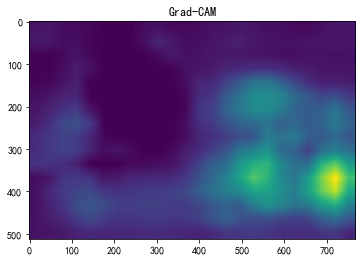

In [32]:
plt.imshow(cam_map)
plt.title('Grad-CAM')
plt.show()

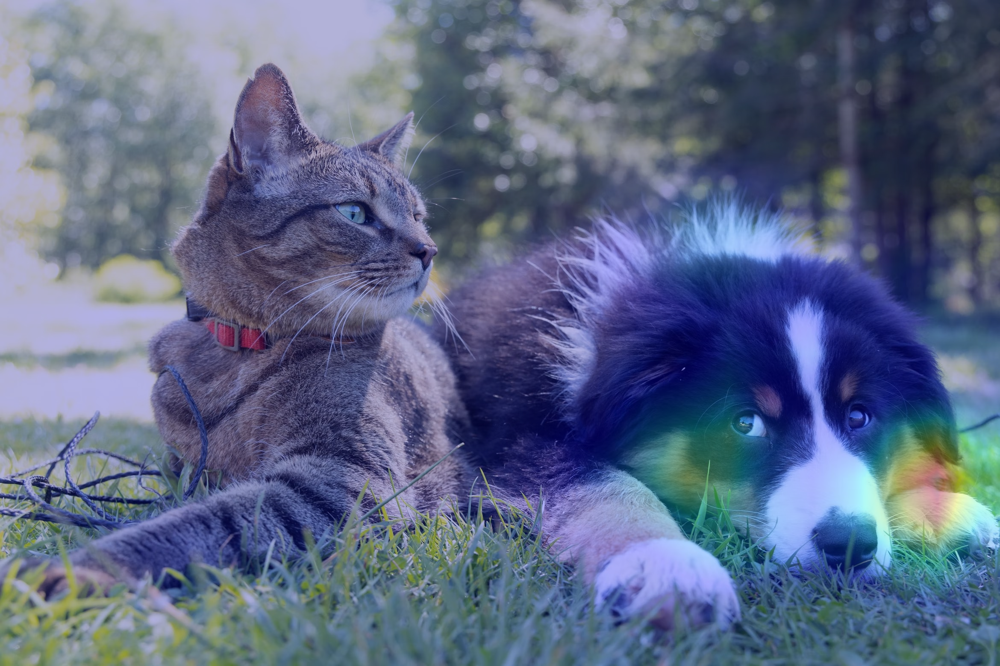

In [33]:
import torchcam
from torchcam.utils import overlay_mask

result = overlay_mask(img_pil, Image.fromarray(cam_map), alpha=0.7)
result

### 2.2 基于Guided Grad-CAM的高分辨率细粒度可解释性分析

Guided Backpropagation算法

In [34]:
from pytorch_grad_cam import GuidedBackpropReLUModel
from pytorch_grad_cam.utils.image import show_cam_on_image, deprocess_image, preprocess_image

In [35]:
# 初始化算法
gb_model = GuidedBackpropReLUModel(model=model, use_cuda=True)
# 生成 Guided Backpropagation热力图
gb_origin = gb_model(input_tensor, target_category=None)
gb_show = deprocess_image(gb_origin)

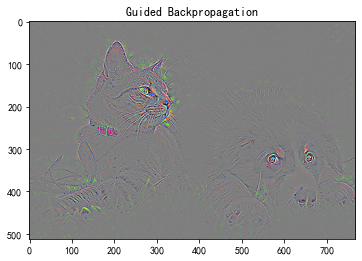

In [36]:
plt.imshow(gb_show)
plt.title('Guided Backpropagation')
plt.show()

将Grad-CAM热力图与Gudied Backpropagation热力图逐元素相乘

In [37]:
# Grad-CAM三通道热力图
cam_mask = cv2.merge([cam_map, cam_map, cam_map])

In [38]:
# 逐元素相乘
guided_gradcam = deprocess_image(cam_mask * gb_origin)

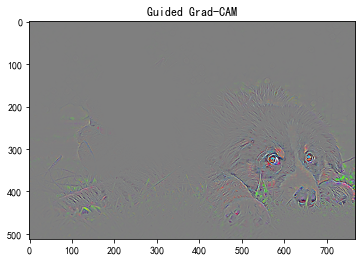

In [39]:
plt.imshow(guided_gradcam)
plt.title('Guided Grad-CAM')
plt.show()

## 3 Captum实战

In [7]:
from captum.attr import Occlusion
from captum.attr import visualization as viz

In [8]:
from torchvision import transforms

# 缩放、裁剪、转 Tensor、归一化
transform_A = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),          
    transforms.ToTensor()         
])

transform_B = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

In [9]:
img_path = './test_img/swan-3299528_1280.jpg'

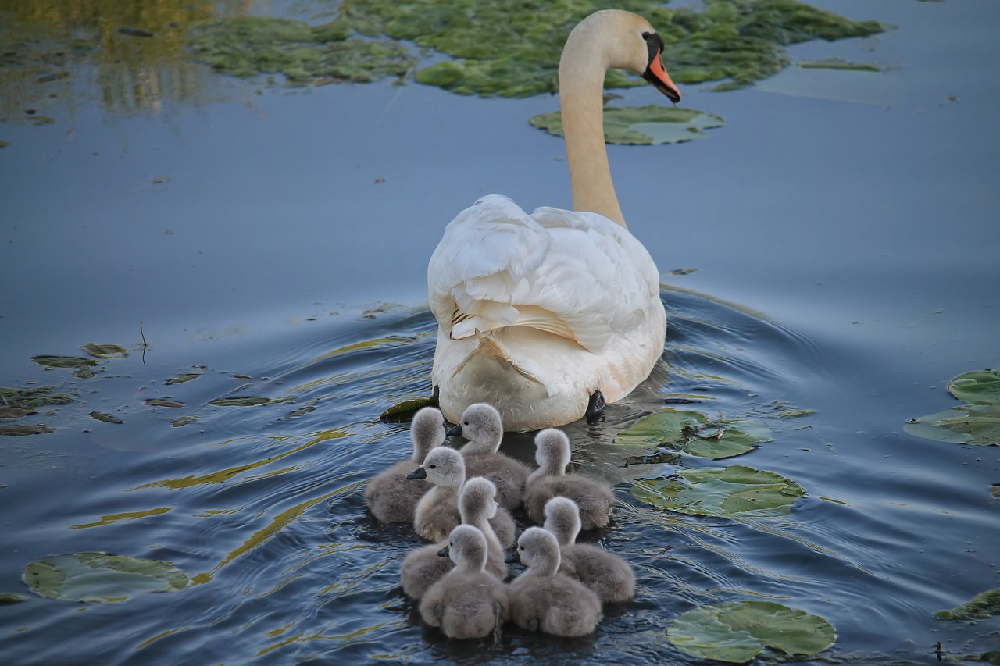

In [10]:
img_pil = Image.open(img_path)
img_pil

In [11]:
# 缩放、裁剪
rc_img = transform_A(img_pil)
# 调整数据维度
rc_img_norm = np.transpose(rc_img.squeeze().cpu().detach().numpy(), (1,2,0))
# 色彩归一化
input_tensor = transform_B(rc_img).unsqueeze(0).to(device)

In [12]:
import torch.nn.functional as F

# 前向预测
pred_logits = model(input_tensor)
# 对 logit 分数做 softmax 运算
pred_softmax = F.softmax(pred_logits, dim=1) 

pred_conf, pred_id = torch.topk(pred_softmax, 1)
pred_conf = pred_conf.detach().cpu().numpy().squeeze().item()
pred_id = pred_id.detach().cpu().numpy().squeeze().item()
pred_id

99

In [13]:
pred_label = idx_to_labels_cn[pred_id]
pred_label

'鹅'

In [14]:
print('预测类别的ID：{}\n名称：{}\n置信度：{:.2f}'.format(pred_id, pred_label, pred_conf))

预测类别的ID：99
名称：鹅
置信度：0.46


### 3.1 遮挡可解释性分析

在输入图像上，用遮挡滑块，滑动遮挡不同区域，探索哪些区域被遮挡后会显著影响模型的分类决策。

提示：因为每次遮挡都需要分别单独预测，因此代码运行可能需要较长时间。

In [15]:
model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model = model.eval().to(device)

In [16]:
occlusion = Occlusion(model)

#### 中等遮挡滑块

In [17]:
# 获得输入图像每个像素的 occ 值
attributions_occ = occlusion.attribute(input_tensor,
                                       strides = (3, 8, 8), # 遮挡滑动移动步长
                                       target=pred_id, # 目标类别
                                       sliding_window_shapes=(3, 15, 15), # 遮挡滑块尺寸
                                       baselines=0) # 被遮挡滑块覆盖的像素值

# 转为 224 x 224 x 3的数据维度
attributions_occ_norm = np.transpose(attributions_occ.detach().cpu().squeeze().numpy(), (1,2,0))

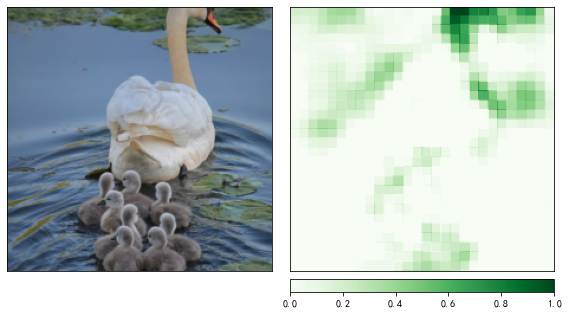

In [18]:
viz.visualize_image_attr_multiple(attributions_occ_norm, # 224 224 3
                                  rc_img_norm,           # 224 224 3
                                  ["original_image", "heat_map"],
                                  ["all", "positive"],
                                  show_colorbar=True,
                                  outlier_perc=2)
plt.show()

#### 大遮挡滑块

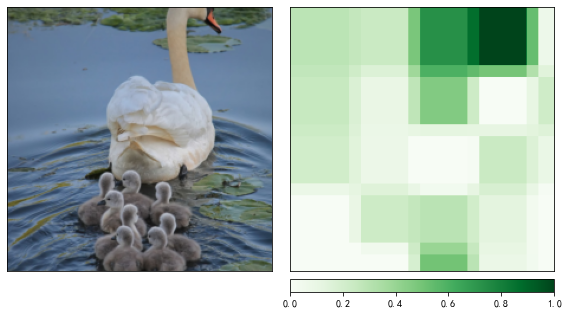

In [19]:
# 更改遮挡滑块的尺寸
attributions_occ = occlusion.attribute(input_tensor,
                                       strides = (3, 50, 50), # 遮挡滑动移动步长
                                       target=pred_id, # 目标类别
                                       sliding_window_shapes=(3, 60, 60), # 遮挡滑块尺寸
                                       baselines=0)

# 转为 224 x 224 x 3的数据维度
attributions_occ_norm = np.transpose(attributions_occ.detach().cpu().squeeze().numpy(), (1,2,0))

viz.visualize_image_attr_multiple(attributions_occ_norm, # 224 224 3
                                  rc_img_norm,           # 224 224 3
                                  ["original_image", "heat_map"],
                                  ["all", "positive"],
                                  show_colorbar=True,
                                  outlier_perc=2)
plt.show()

#### 小遮挡滑块

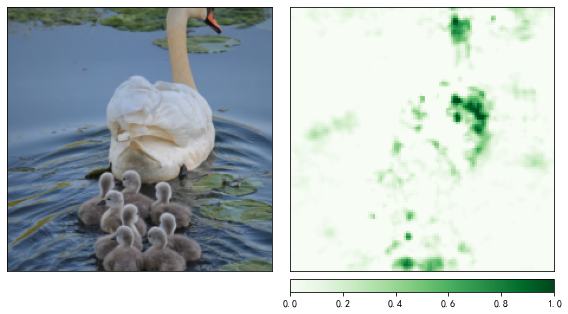

In [23]:
# 更改遮挡滑块的尺寸
attributions_occ = occlusion.attribute(input_tensor,
                                       strides = (3, 2, 2), # 遮挡滑动移动步长
                                       target=pred_id, # 目标类别
                                       sliding_window_shapes=(3, 4, 4), # 遮挡滑块尺寸
                                       baselines=0)

# 转为 224 x 224 x 3的数据维度
attributions_occ_norm = np.transpose(attributions_occ.detach().cpu().squeeze().numpy(), (1,2,0))

viz.visualize_image_attr_multiple(attributions_occ_norm, # 224 224 3
                                  rc_img_norm,           # 224 224 3
                                  ["original_image", "heat_map"],
                                  ["all", "positive"],
                                  show_colorbar=True,
                                  outlier_perc=2)
plt.show()

### 3.2 Integrated Gradients可解释性分析

Integrated Gradients原理：输入图像像素由空白变为输入图像像素的过程中，`模型预测为某一特定类别的概率`相对于`输入图像像素`的梯度积分。

In [15]:
from captum.attr import IntegratedGradients
from captum.attr import NoiseTunnel

In [16]:
# 初始化可解释性分析方法
integrated_gradients = IntegratedGradients(model)

In [17]:
# 获得输入图像每个像素的 IG 值
attributions_ig = integrated_gradients.attribute(input_tensor, target=pred_id, n_steps=50)
# 转为 224 x 224 x 3的数据维度
attributions_ig_norm = np.transpose(attributions_ig.detach().cpu().squeeze().numpy(), (1,2,0))

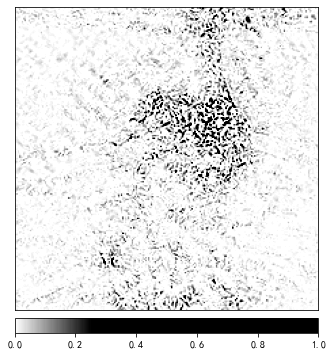

In [18]:
from matplotlib.colors import LinearSegmentedColormap

# 设置配色方案
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

# 可视化 IG 值
viz.visualize_image_attr(attributions_ig_norm, # 224,224,3
                         rc_img_norm,          # 224,224,3
                         method='heat_map',
                         cmap=default_cmap,
                         show_colorbar=True,
                         sign='positive',
                         outlier_perc=1)
plt.show()

#### 加入高斯噪声的多张图像，平滑输出

在输入图像中加入高斯噪声，构造`nt_samples`个噪声样本，分别计算IG值，再使用`smoothgrad_sq（先平均再平方）`平滑。

In [19]:
noise_tunnel = NoiseTunnel(integrated_gradients)

# 获得输入图像每个像素的 IG 值
attributions_ig_nt = noise_tunnel.attribute(input_tensor, nt_samples=3, nt_type='smoothgrad_sq', target=pred_id)

# 转为 224 x 224 x 3的数据维度
attributions_ig_nt_norm = np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0))

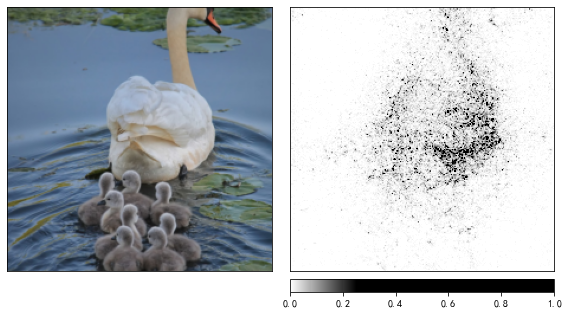

In [20]:
# 设置配色方案
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

viz.visualize_image_attr_multiple(attributions_ig_nt_norm, # 224 224 3
                                  rc_img_norm, # 224 224 3
                                  ["original_image", "heat_map"],
                                  ["all", "positive"],
                                  cmap=default_cmap,
                                  show_colorbar=True)
plt.show()

## 4 本章总结

本次任务，主要介绍了CAM和Captum工具包的使用，包括：

1. 基于resnet18模型和ImageNet 1000图像分类标签，进行图像识别
2. 使用torchcam工具包对单张图片、视频图像和摄像头实时进行图像分类识别，并生成CAM热力图
3. 使用pytorch_grad_cam工具包进行GradCAM热力图可解释性分析
4. 使用captum工具包对图像进行遮挡、Intgrated Gradients、GradientShap可解释性分析